In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

#precisa ser usada apenas no google colab
from IPython.display import HTML
from matplotlib import rc

**1 - Gerando os dados do gráfico**

In [2]:
def projectile_motion(v0, theta, g, num_points):
    """
    Calcula a trajetória de um projétil em movimento parabólico.

    Parâmetros:

      v0 (float): Velocidade inicial do projétil em m/s.
      theta (float): Ângulo de lançamento do projétil em graus.
      g (float): Aceleração da gravidade em m/s^2.
      num_points (int): Número de pontos para a geração do vetor de tempo.

    Retorna:
      t : numpy.ndarray
          Vetor de tempo para o movimento do projétil.
      y : numpy.ndarray
          Vetor de posições horizontais ao longo do tempo.
      z : numpy.ndarray
          Vetor de posições verticais ao longo do tempo.
    """
    v0y = v0 * np.cos(np.radians(theta))
    v0z = v0 * np.sin(np.radians(theta))

    t_total = 2 * v0z / g

    t = np.linspace(0, t_total, num=num_points)

    y = v0y * t  # Posição horizontal
    z = v0z * t - 0.5 * g * t**2  # Posição vertical

    return t, y, z

In [3]:
t,y,z = projectile_motion(50, 45, 9.8, 500)

**2 - Configuração do gráfico**

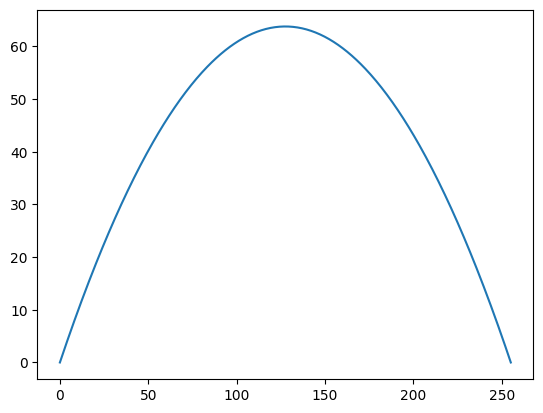

In [4]:
fig, ax = plt.subplots()
line, = ax.plot(y,z)

**ANIMAÇÃO**

(0.0, 70.15277948641955)

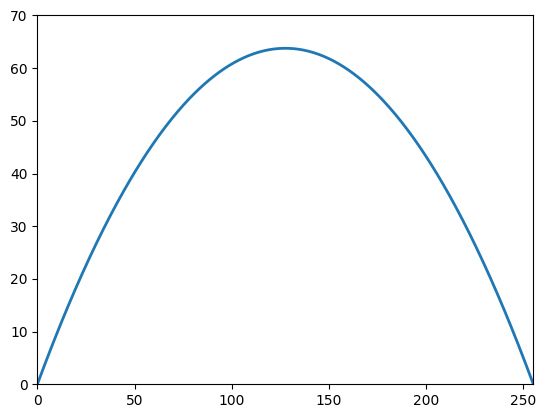

In [9]:
# Inicializando o gráfico
fig, ax = plt.subplots()
line, = ax.plot([],[], lw=2)

ax.set_xlim(0, max(y))
ax.set_ylim(0, max(z) * 1.1)


In [10]:
# Função de atualização para a animação
def update(frame):
    line.set_data(y[:frame], z[:frame])
    return line,

In [11]:
# Criando a animação
ani = FuncAnimation(fig, update, frames=len(t), interval=20)

# Configuração para Jupyter Notebook ou Google Colab
rc('animation', html='jshtml')
ani